In [1]:
import tensorflow as tf
import tools.datasets.mnist3 as mnist_tools
import tools.datasets.svhn as svhn_tools
import tools.semisup as semisup
import numpy as np
import architectures as arch
from functools import partial

import tools.visualization as vis
import tools.updated_semisup as up

%load_ext autoreload
%autoreload 2

/home/frankzl/.envs/env36-ml/.venv/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [ ]:
gph = tf.Graph()

my_semb = semb_list[-1]
my_uemb = uemb_list[-1]

embedding_dim = my_semb.shape[1]

reshaped_semb = my_semb.reshape((-1, 1, embedding_dim))
reshaped_uemb = my_uemb.reshape((-1, 1, embedding_dim))

repeat_semb = np.repeat(reshaped_semb, unsup_batch_size, axis=1)
repeat_uemb = np.repeat(reshaped_uemb, sup_per_batch*NUM_LABELS, axis=1)

uemb_T = np.transpose(repeat_uemb, axes=[1,0,2])

sigma = 1.5
my_match_ab = np.exp(-(np.linalg.norm(repeat_semb - uemb_T, axis=2)**2)/(2*sigma**2))


with gph.as_default():
    
    t_sup_emb   = tf.constant(my_semb)
    t_unsup_emb = tf.constant(my_uemb)
    
    embedding_dim = t_sup_emb.shape[1]
    reshaped_semb = tf.reshape( t_sup_emb, [-1, 1, embedding_dim] )
    reshaped_uemb = tf.reshape( t_unsup_emb, [-1, 1, embedding_dim] )
    
    stacked_semb = tf.stack(unsup_batch_size*[t_sup_emb], 1)
    stacked_uemb = tf.stack(sup_per_batch*NUM_LABELS*[t_unsup_emb], 1)
    
    uemb_T = tf.transpose(stacked_uemb, perm=[1,0,2])
     
    sigma = 1
    pairwise_dist = (stacked_semb - uemb_T)#, axis=2)
    pairwise_norm = tf.norm( pairwise_dist, axis=2)
    pairwise_sq   = tf.square(pairwise_norm)
    
    my_match_ab   = tf.exp(- tf.divide( pairwise_sq, 2*sigma**2))
    
    p_ab = tf.nn.softmax(my_match_ab, name='p_ab')
    p_ba = tf.nn.softmax(tf.transpose(my_match_ab), name='p_ba')
    p_aba = tf.matmul(p_ab, p_ba, name='p_aba')
    
    #tf.div(pairwise_dist
    #my_match_ab = np.exp(-(np.linalg.norm(repeat_semb - uemb_T, axis=2)**2)/(2*sigma**2))

(640, 1024, 128)
elapsed 8.548093318939209


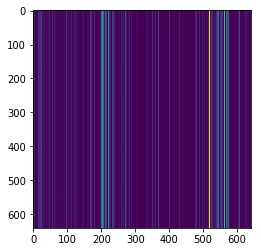

In [175]:
t1 = time.time()
with tf.Session(graph=gph) as sess:
    #badumm, p_norm = (sess.run([stacked_semb, stacked_uemb]))
    badumm, p_norm = (sess.run([stacked_semb, p_aba]))
    print(badumm.shape)
    print(f"elapsed {time.time() - t1}")

plt.imshow(p_norm)

In [3]:
mnist_train_images, mnist_train_labels = mnist_tools.get_data('train')
mnist_test_images, mnist_test_labels = mnist_tools.get_data('test')
svhn_train_images, svhn_train_labels = svhn_tools.get_data('train')
svhn_test_images, svhn_test_labels = svhn_tools.get_data('test')

Extracting /home/frankzl/datasets/mnist/train-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist/train-labels-idx1-ubyte.gz
Extracting /home/frankzl/datasets/mnist/t10k-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist/t10k-labels-idx1-ubyte.gz


In [4]:
# labeled samples used per class
# sup_per_class = 10
sup_per_class = 1280
sup_seed = -1
# labeled samples per class per batch
sup_per_batch = 64 
# unlabeled samples per batch
unsup_batch_size = 1024
unsup_samples = 10240

learning_rate = 1e-4
decay_steps = 9000
decay_factor = 0.33
logit_weight = 1.0

max_steps = 2000
eval_interval = 500

log_dir = "logs/training/mnist-svhn/mnist-svhn"

seed = 1

IMAGE_SHAPE = mnist_tools.IMAGE_SHAPE
NUM_LABELS = mnist_tools.NUM_LABELS

# [10 (classes), 10 (samples), 28, 28, 1]
sup_by_label = semisup.sample_by_label(mnist_train_images, mnist_train_labels,
                        sup_per_class, NUM_LABELS, seed)

In [5]:
visit_weight_envelope = "linear"
visit_weight = 1.6
visit_weight_envelope_steps = 1
visit_weight_envelope_delay = 500

walker_weight_envelope = "linear"
walker_weight = 1.6
walker_weight_envelope_steps = 1
walker_weight_envelope_delay = 500

TARGET_SHAPE = svhn_tools.IMAGE_SHAPE
TEST_SHAPE   = TARGET_SHAPE

image_shape = IMAGE_SHAPE
new_shape   = TARGET_SHAPE
emb_size    = 128

In [6]:
# Sample unlabeled training subset.
if unsup_samples > -1:
    num_unlabeled = len(svhn_train_images)
    assert unsup_samples <= num_unlabeled, (
        'Chose more unlabeled samples ({})'
        ' than there are in the '
        'unlabeled batch ({}).'.format(unsup_samples, num_unlabeled))

    rng = np.random.RandomState(seed=seed)
    choice = rng.choice(num_unlabeled, unsup_samples, False)
    sampled_unsup_images = svhn_train_images[choice]
    sampled_unsup_labels = svhn_train_labels[choice]
else:
    sampled_unsup_images = svhn_train_images
    sampled_unsup_labels = svhn_train_labels

In [7]:
from ipywidgets import IntProgress, Layout
from train import apply_envelope

graph = tf.Graph()

with graph.as_default():
    
    unsup_data = up.create_input(sampled_unsup_images, sampled_unsup_labels, unsup_batch_size)
    unsup_it   = unsup_data.make_initializable_iterator()
    
    t_unsup_images,t_unsup_labels = unsup_it.get_next()
    
    sup_data,sup_label = up.create_per_class_inputs_v2(sup_by_label, sup_per_batch)
    sup_it             = sup_data.repeat().make_one_shot_iterator()
    sup_it_label       = sup_label.repeat().make_one_shot_iterator()
    
    model_func = partial(
        arch.svhn_model,
        new_shape=new_shape,
        img_shape=image_shape,
        emb_size=emb_size
    )
    
    model = semisup.SemisupModel(model_func, NUM_LABELS, IMAGE_SHAPE,
                                 test_in=tf.placeholder(np.float32, [None] + TEST_SHAPE, 'test_in')
                                )
    
    t_sup_images, t_sup_labels = tf.concat( sup_it.get_next(), 0), tf.concat( sup_it_label.get_next(), 0)
    
    t_sup_emb   = model.image_to_embedding(t_sup_images)
    t_unsup_emb = model.image_to_embedding(t_unsup_images)
    
    t_sup_logit = model.embedding_to_logit(t_sup_emb)
    
    visit_weight = apply_envelope(
        type = visit_weight_envelope,
        step = model.step,
        final_weight = visit_weight,
        growing_steps = visit_weight_envelope_steps,
        delay = visit_weight_envelope_delay
    )
    
    walker_weight = apply_envelope(
        type = walker_weight_envelope,
        step = model.step,
        final_weight = walker_weight,
        growing_steps = walker_weight_envelope_steps,
        delay = walker_weight_envelope_delay
    )
    
    tf.summary.scalar("Weights_Visit", visit_weight)
    tf.summary.scalar("Weight_Walker", walker_weight)
    
    model.add_logit_loss(t_sup_logit, t_sup_labels, weight=logit_weight)
    
    #model.add_semisup_loss(t_sup_emb, t_unsup_emb, t_sup_labels, visit_weight=visit_weight, walker_weight=walker_weight)
    equality_matrix = tf.equal(tf.reshape(t_sup_labels, [-1, 1]), t_sup_labels)
    equality_matrix = tf.cast(equality_matrix, tf.float32)
    p_target = (equality_matrix / tf.reduce_sum(
        equality_matrix, [1], keepdims=True))

    multiple_semb = tf.constant([unsup_batch_size])
    multiple_uemb = tf.constant([sup_per_batch*NUM_LABELS])
    
    embedding_dim = t_sup_emb.shape[1]
    reshaped_semb = tf.reshape( t_sup_emb, [-1, 1, embedding_dim] )
    reshaped_uemb = tf.reshape( t_unsup_emb, [-1, 1, embedding_dim] )
    
    stacked_semb = tf.stack(unsup_batch_size*[t_sup_emb], 1)
    stacked_uemb = tf.stack(sup_per_batch*NUM_LABELS*[t_unsup_emb], 1)
    
    uemb_T = tf.transpose(stacked_uemb, perm=[1,0,2])
     
    sigma = 1
    pairwise_dist = (stacked_semb - uemb_T)#, axis=2)
    pairwise_norm = tf.norm( pairwise_dist, axis=2)
    pairwise_sq   = tf.square(pairwise_norm)
    
    match_ab   = tf.exp(- tf.divide( pairwise_sq, tf.constant(2*sigma**2, dtype=tf.float32)), name='match_ab')
    
    p_ab = tf.nn.softmax(match_ab, name='p_ab')
    p_ba = tf.nn.softmax(tf.transpose(match_ab), name='p_ba')
    p_aba = tf.matmul(p_ab, p_ba, name='p_aba')

    model.create_walk_statistics(p_aba, equality_matrix)
    
    loss_aba = tf.losses.softmax_cross_entropy(
        p_target,
        tf.log(1e-8 + p_aba),
        weights=walker_weight,
        scope='loss_aba')
    model.add_visit_loss(p_ab, visit_weight)

    tf.summary.scalar('Loss_aba', loss_aba)
    
    t_learning_rate = tf.train.exponential_decay(
        learning_rate,
        model.step,
        decay_steps,
        decay_factor,
        staircase = True
    )
    
    train_op = model.create_train_op(t_learning_rate)
    summary_op = tf.summary.merge_all()
    
    summary_writer = tf.summary.FileWriter(log_dir, graph)
    
    saver = tf.train.Saver(max_to_keep=30)

---------
Variables: name (type shape) [size]
---------
net/conv1/weights:0 (float32_ref 3x3x3x32) [864, bytes: 3456]
net/conv1/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv1_2/weights:0 (float32_ref 3x3x32x32) [9216, bytes: 36864]
net/conv1_2/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv1_3/weights:0 (float32_ref 3x3x32x32) [9216, bytes: 36864]
net/conv1_3/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv2_1/weights:0 (float32_ref 3x3x32x64) [18432, bytes: 73728]
net/conv2_1/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv2_2/weights:0 (float32_ref 3x3x64x64) [36864, bytes: 147456]
net/conv2_2/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv2_3/weights:0 (float32_ref 3x3x64x64) [36864, bytes: 147456]
net/conv2_3/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv3/weights:0 (float32_ref 3x3x64x128) [73728, bytes: 294912]
net/conv3/biases:0 (float32_ref 128) [128, bytes: 512]
net/conv3_2/weights:0 (float32_ref 3x3x128x128) [147456, bytes: 589824]
net/conv3_2/biases:

In [8]:
import time
import datetime

store_dir = "logs/training/mnist-svhn-k-sigma-1/mnist-svhn-visit"
temp_dir = 'logs/training/mnist-svhn-visit1.6/mnist-svhn-visit'

In [10]:

for step in range(501, max_steps):
    print(step)

501
502
503
504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
679
680
681
682
683
684
685
686
687
688
689
690
691
692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
719
720
721
722
723
724
725
726
727
728
729
730
731
732
733
734
735
736
737
738
739
740
741
742
743
744
745
746
747
748
749
750


In [14]:
import time
import datetime

test_images = svhn_test_images[:2000]
test_labels = svhn_test_labels[:2000]


from IPython.display import display

max_steps = 1002
f = IntProgress(min=0, max=max_steps, layout= Layout(width="100%")) # instantiate the bar
display(f) # display the bar

sesh = tf.Session(graph = graph, config=tf.ConfigProto(intra_op_parallelism_threads=2, allow_soft_placement=True))

eval_interval = 100

p_aba_list = []
match_ab_list = []
t_sup_emb_list = []
t_unsup_emb_list = []


model_checkpoint = f"{log_dir}-{501}"

with sesh as sess:
    
    saver = tf.train.Saver()
    saver.restore(sess, model_checkpoint)
    
    sess.run(unsup_it.initializer)
    
    epoch = 0
    
    for step in range(501, max_steps):
        t0 = time.time()
        try:
            loss, _, summaries = sess.run([model.train_loss, train_op, summary_op])
        except tf.errors.OutOfRangeError:
            sess.run(unsup_it.initializer)
            epoch += 1
            
            loss, _, summaries = sess.run([model.train_loss, train_op, summary_op])
           
        f.value = step
        f.description = f"Ep{epoch}:{step}/{max_steps}"
        if (step) % eval_interval == 0 or step == 99:
            
            t1 = time.time()
            print(f"Time left: {datetime.timedelta(seconds=int((t1-t0)*(max_steps-step)))}s")
            
            print('Step: %d' % step)
            test_pred = model.classify(test_images).argmax(-1)
            conf_mtx = semisup.confusion_matrix(test_labels, test_pred, NUM_LABELS)
            test_err = (test_labels != test_pred).mean() * 100
            print(conf_mtx)
            print('Test error: %.2f %%' % test_err)
            print(f'Loss: {loss}')
            print()
    
            test_summary = tf.Summary(
                value=[tf.Summary.Value(
                    tag='Test Err', simple_value=test_err)])
    
            summary_writer.add_summary(summaries, step)
            summary_writer.add_summary(test_summary, step)

            print(f"saving model - step {step}")
            saver.save(sess, store_dir, global_step=model.step)

IntProgress(value=0, layout=Layout(width='100%'), max=1002)

INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-501
Time left: 2:34:56s
Step: 600
[[ 42  43   8  13   3   8   2   9   3   7]
 [ 40 151  10  27  49  19  10  33  36   3]
 [ 27  52  73  37  19  17   2  42  29   4]
 [ 49  40  12  61  11  11   1  26  23   2]
 [ 27  50   9   9  37  28   4  24   6   5]
 [ 28  23   8  27   5  38   1  24  14   3]
 [ 17  31   5  12   2  29  17  22  16   1]
 [ 11  42  10  11   6   8   0  62   9   0]
 [ 32  25   1  18   3   7   3  17  30   2]
 [ 29  19  10  23   3   8   1   8  14  12]]
Test error: 73.85 %
Loss: Tensor("total_loss:0", shape=(), dtype=float32)

saving model - step 600
Time left: 2:24:32s
Step: 700
[[ 46  41   6   8   3  12   2   9   3   8]
 [ 45 150  11  19  51  26  10  24  36   6]
 [ 26  56  73  30  22  28   2  35  26   4]
 [ 48  49  13  51  12  18   0  20  20   5]
 [ 26  51   9   6  42  34   3  15   6   7]
 [ 32  22   8  18   6  46   1  21  13   4]
 [ 20  27   5   8   3  39  17  20  12   1]
 [ 12  42  12   7   7  12  

In [35]:
import matplotlib.pyplot as plt

p_aba_list[0]

array([[0.00156331, 0.00156107, 0.00156224, ..., 0.00156125, 0.00156253,
        0.00156397],
       [0.00156331, 0.00156107, 0.00156224, ..., 0.00156126, 0.00156253,
        0.00156397],
       [0.00156331, 0.00156107, 0.00156224, ..., 0.00156125, 0.00156253,
        0.00156397],
       ...,
       [0.0015633 , 0.00156106, 0.00156223, ..., 0.00156126, 0.00156253,
        0.00156397],
       [0.00156331, 0.00156107, 0.00156223, ..., 0.00156125, 0.00156253,
        0.00156397],
       [0.00156331, 0.00156106, 0.00156223, ..., 0.00156125, 0.00156253,
        0.00156398]], dtype=float32)

In [16]:
all_steps = range(1,902,100)

train_step = 901
p_aba_list = []
match_ab_list = []
p_ab_list = []
semb_list = []
uemb_list = []
slabel_list = []
ulabel_list = []

for train_step in all_steps:
    if train_step <= 501:
        model_checkpoint = f"{log_dir}-{train_step}"
    else:
        model_checkpoint = f"{store_dir}-{train_step}"

    #model_checkpoint = f"{log_dir}-{train_step}"

    with tf.Session(graph=graph) as sess:
        
        saver = tf.train.Saver()
        saver.restore(sess, model_checkpoint)
        
        sess.run(unsup_it.initializer)
        
        pab, slabel, ulabel, ab, aba, semb, uemb = sess.run([p_ab, t_sup_labels, t_unsup_labels, match_ab, p_aba, t_sup_emb, t_unsup_emb])
        p_aba_list.append(aba)
        match_ab_list.append(ab)
        p_ab_list.append(pab)
        semb_list.append(semb)
        uemb_list.append(uemb)
        slabel_list.append(slabel)
        ulabel_list.append(ulabel)

INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-1
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-101
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-201
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-301
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-401
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn/mnist-svhn-501
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn-k-sigma-1/mnist-svhn-visit-601
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn-k-sigma-1/mnist-svhn-visit-701
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn-k-sigma-1/mnist-svhn-visit-801
INFO:tensorflow:Restoring parameters from logs/training/mnist-svhn-k-sigma-1/mnist-svhn-visit-901


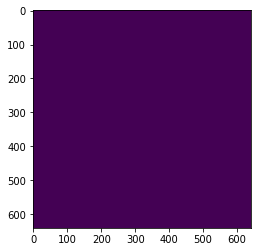

In [29]:
#my_match_ab = semb_list[-1] @ uemb_list[-1].T

my_semb = semb_list[-1]
my_uemb = uemb_list[-1]

embedding_dim = my_semb.shape[1]

reshaped_semb = my_semb.reshape((-1, 1, embedding_dim))
reshaped_uemb = my_uemb.reshape((-1, 1, embedding_dim))

repeat_semb = np.repeat(reshaped_semb, len(reshaped_uemb), axis=1)
repeat_uemb = np.repeat(reshaped_uemb, len(reshaped_semb), axis=1)

uemb_T = np.transpose(repeat_uemb, axes=[1,0,2])

sigma = 1
my_match_ab = np.exp(-(np.linalg.norm(repeat_semb - uemb_T, axis=2)**2)/(2*sigma**2))

from sklearn.utils.extmath import softmax
ab = softmax(my_match_ab)


import matplotlib.pyplot as plt
fig = plt.figure()
#plt.imshow(np.matmul(ab, softmax(my_match_ab.T)))
plt.imshow(p_aba_list[-1])

In [36]:
sorted_uemb_list     = []
sorted_match_ab_list = []

for idx in range(len(uemb_list)):
    sorted_uemb_list.append(uemb_list[idx][ulabel_list[idx].argsort()])
    sorted_match_ab_list.append(semb_list[idx] @ sorted_uemb_list[idx].T)

In [37]:
from ipywidgets import IntSlider, RadioButtons
from IPython.html.widgets import *
import matplotlib.pyplot as plt

def plot_img(array, step):
    if array == 0:
        a = p_aba_list
    elif array == 1:
        a = match_ab_list
    else:
        a = sorted_match_ab_list
            
    fig = plt.figure()
    plt.imshow(a[(step-1)//100])

interact(
    lambda step, array: plot_img(array, step),
    step = IntSlider(
        value=901,
        min=1,
        max=1501,
        step=100,
        description='Train Step',
        continuous_update=True,
        orientation='horizontal',
    ),
    array = RadioButtons(
        options=[('p_aba', 0), ("match_ab", 1), ("sorted_match_ab", 2)],
    )
)

/home/frankzl/.envs/env36-ml/.venv/lib/python3.6/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


interactive(children=(IntSlider(value=901, description='Train Step', max=1501, min=1, step=100), RadioButtons(…

<function __main__.<lambda>(step, array)>

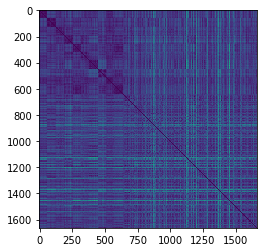

In [21]:
from tools.analyzer import Distance
import tools.analyzer as ana


idx = -1
stacked = np.vstack((semb_list[idx], uemb_list[idx][ulabel_list[idx].argsort()]))

similarity = ana.get_pairwise_distance(
  stacked, 
  Distance.l2)


dot_similarity = (stacked@stacked.T)

import matplotlib.pyplot as plt
fig = plt.figure()

#plt.imshow(dot_similarity)
plt.imshow(similarity)


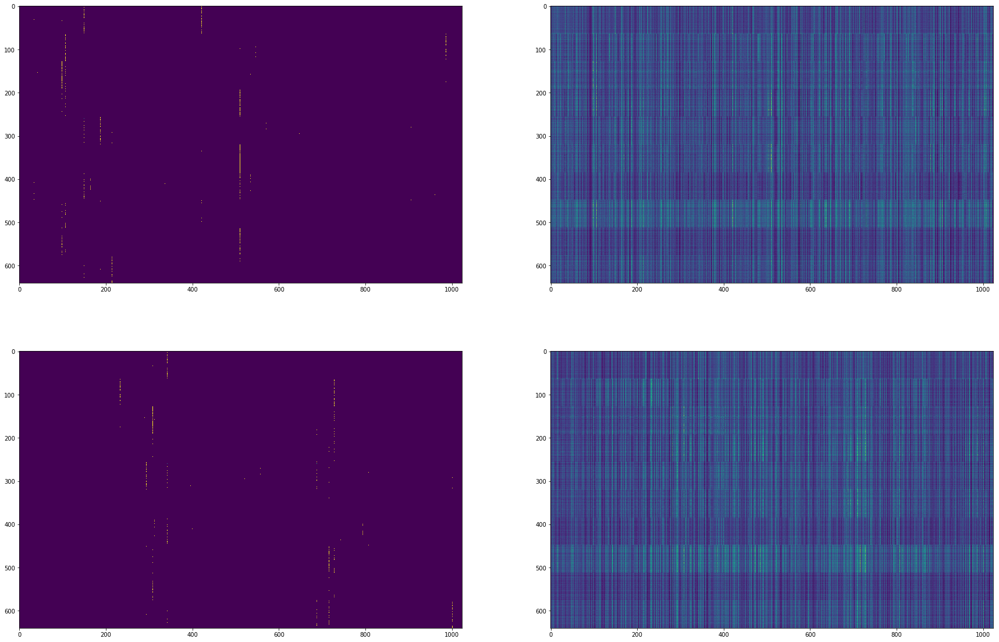

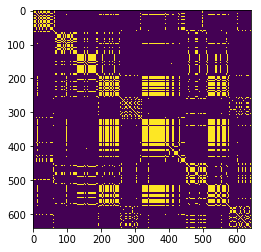

In [38]:
import numpy
from scipy.special import softmax

fig = plt.figure(figsize=(30,20))
my_match_ab = semb_list[-1] @ uemb_list[-1].T
my_p_ab     = softmax(my_match_ab, axis=1)

idx = -1

my_sorted_match_ab = semb_list[idx] @ uemb_list[idx][ulabel_list[idx].argsort()].T
my_sorted_p_ab     = softmax(my_sorted_match_ab, axis=1)

#my_match_ba = my_match_ab.T

my_p_aba = my_p_ab @ my_p_ab.T

plt.subplot(221)
plt.imshow(my_p_ab) 
fig = plt.subplot(222)
plt.imshow(my_match_ab)
fig = plt.subplot(223)
plt.imshow(my_sorted_p_ab) 
fig = plt.subplot(224)
plt.imshow(my_sorted_match_ab)
fig = plt.figure()
plt.imshow(my_p_aba)

In [24]:
import numpy
from scipy.special import softmax

def plot_sigma_effect(sigma):
    fig = plt.figure(figsize=(30,20))
    my_match_ab = semb_list[-1] @ uemb_list[-1].T
    my_p_ab     = softmax(my_match_ab, axis=1)
    
    idx = -1
    
    my_sorted_uemb = uemb_list[idx][ulabel_list[idx].argsort()]
    
    #my_sorted_match_ab = semb_list[idx] @ my_sorted_uemb.T
    
    for row in range(semb_list[idx].shape[0]):
        for col in range(uemb_list[idx].shape[0]):
            my_sorted_match_ab[row][col] = Distance.get_gaussian_k(sigma)(semb_list[idx][row], my_sorted_uemb[col])
    
    my_sorted_p_ab = softmax(my_sorted_match_ab, axis=1)
    
    #my_match_ba = my_match_ab.T
    
    #my_p_aba = my_p_ab @ my_p_ab.T
    
    my_p_aba = my_sorted_p_ab @ my_sorted_p_ab.T
    
    ax1 = fig.add_subplot(131)
    ax1.title.set_text(f"sigma {sigma}: sorted p_ab")
    plt.imshow(my_sorted_p_ab)
    ax2 = fig.add_subplot(132)
    ax2.title.set_text("sorted match_ab")
    plt.imshow(my_sorted_match_ab)
    ax3 = fig.add_subplot(133)
    ax3.title.set_text("p_aba")
    plt.imshow(my_p_aba)
 

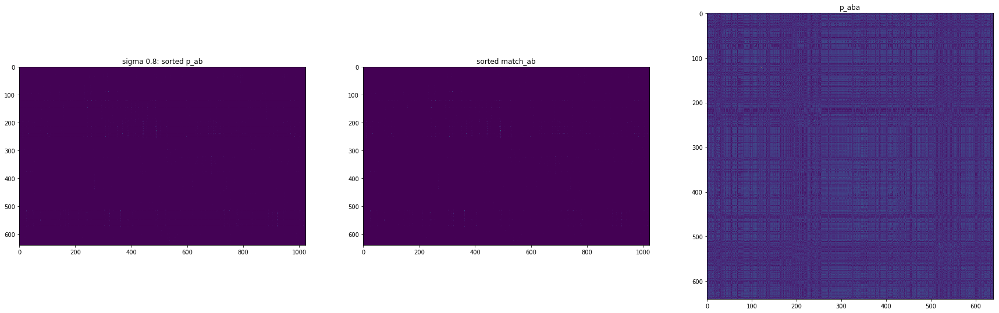

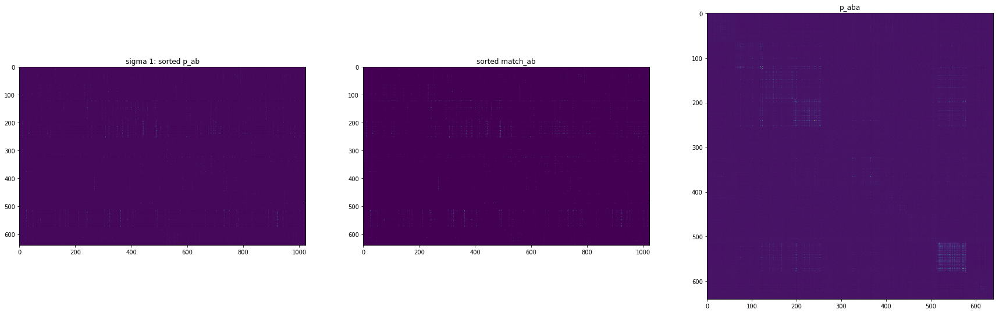

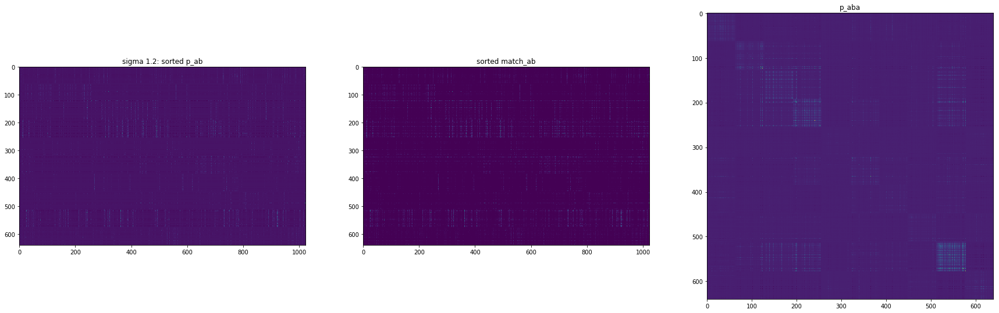

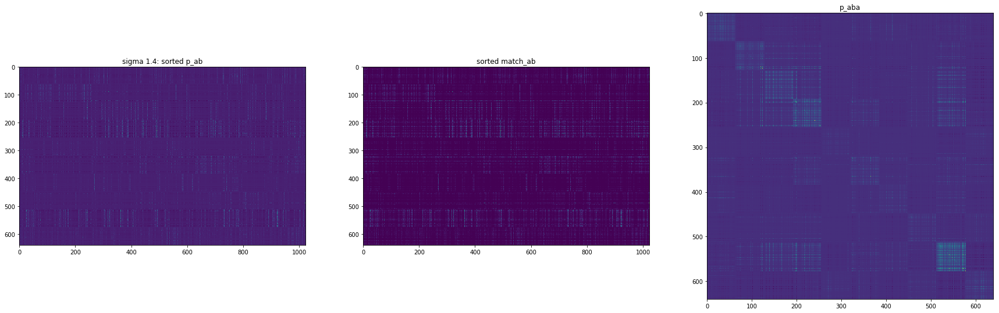

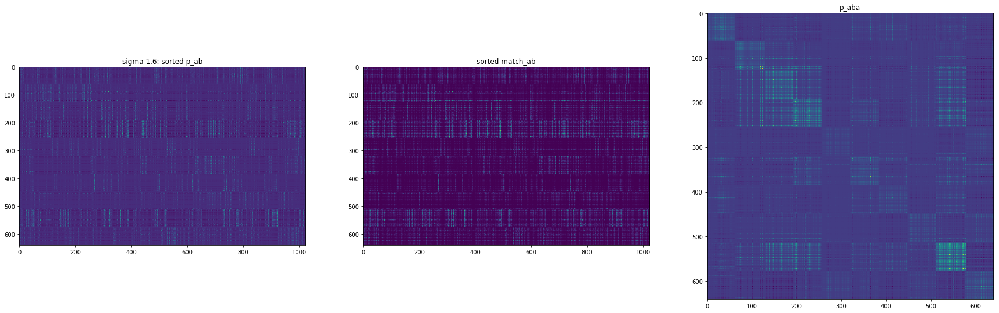

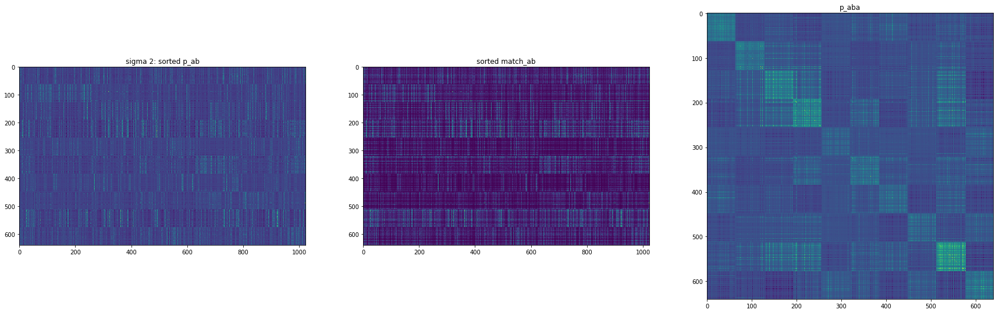

In [25]:
sigmas = [0.8, 1, 1.2, 1.4, 1.6, 2]
for sigma in sigmas:
    plot_sigma_effect(sigma)

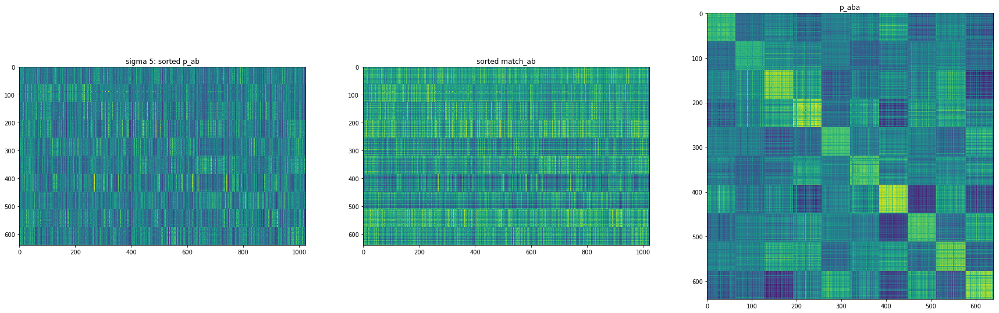

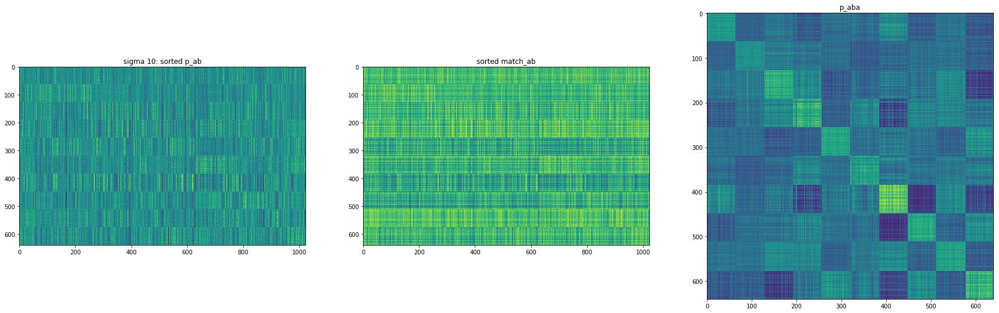

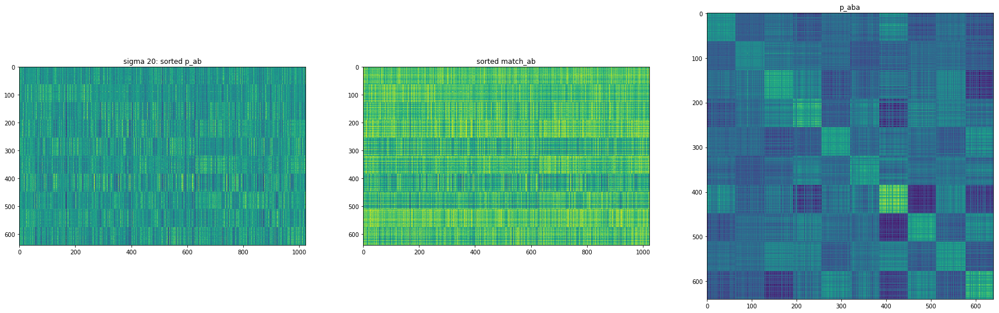

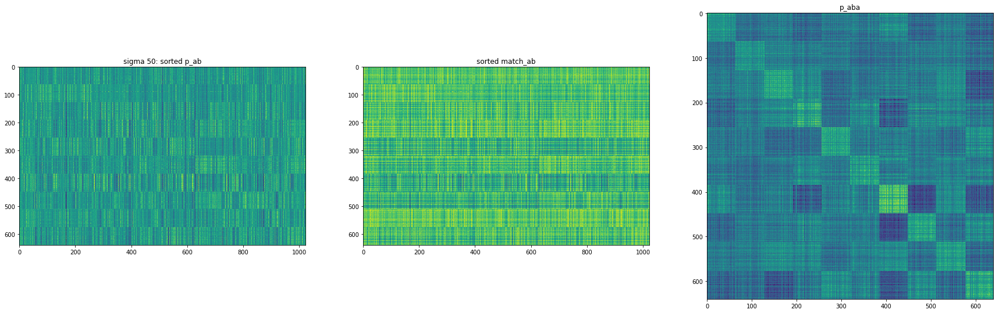

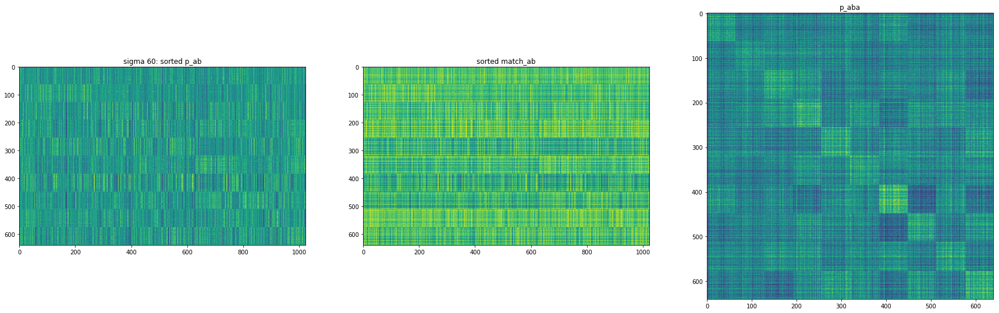

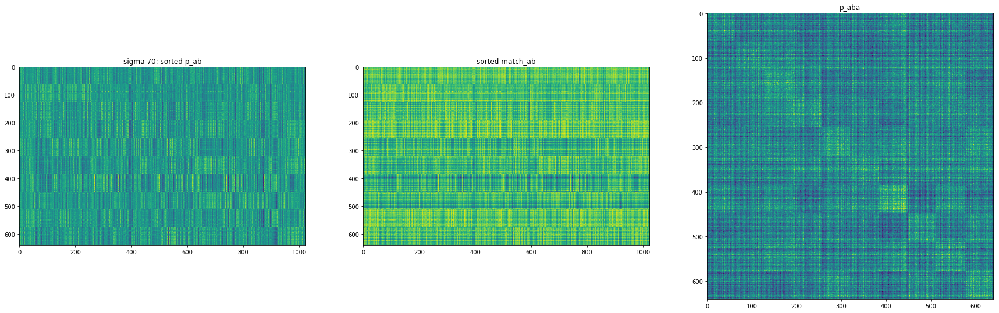

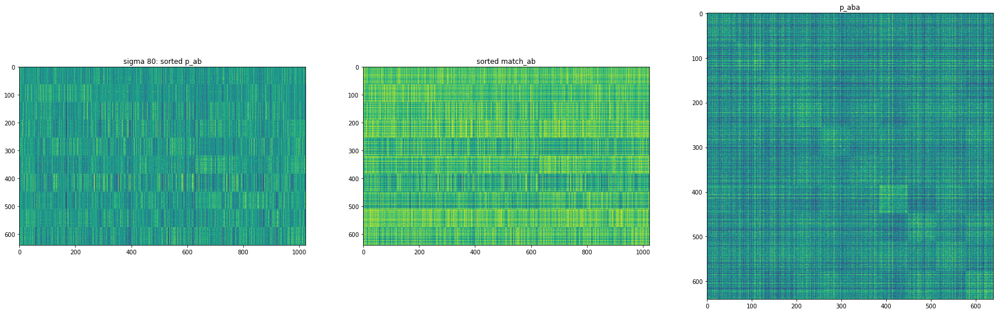

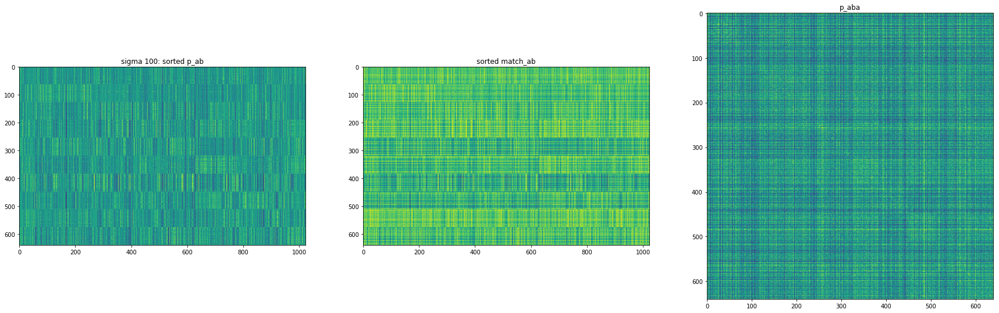

In [28]:
sigmas = [5, 10, 20, 50, 60, 70, 80, 100]
for sigma in sigmas:
    plot_sigma_effect(sigma)

# larger sigma what happens?
- higher similarity between the match_ab
- more spread out distribution for p_ab
- higher deviation from the desired equality matrix (diagonal)
    
- the probability of going from A -> B -> A becomes less likely
- Hypothesis: this will force our network to learn better features to differentiate between the classes within the unsupervised space

# smaller sigma what happens?
- lower similarity between the match_ab
- more distinct distribution for p_ab: **sparsity**
- the probability of going from A -> B -> A is likely, but only for very few samples
- Hypothesis: this will force our network to learn better features to find the classes of the unsupervised space

In [70]:
print(repeat_semb.shape)
print(repeat_uemb.shape)

(640, 1024, 128)
(1024, 640, 128)


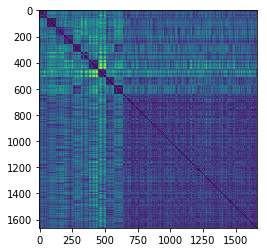

In [29]:
idx = -1
stacked = np.vstack((semb_list[idx], uemb_list[idx][ulabel_list[idx].argsort()]))

similarity = ana.get_pairwise_distance(
  stacked, 
  Distance.l2)


dot_similarity = (stacked@stacked.T)

import matplotlib.pyplot as plt
fig = plt.figure()

#plt.imshow(dot_similarity)
plt.imshow(similarity)